# Mean Field Games with congestion effects 

Auteurs:
- GANIYU Isaac
- TORRES Jason

#### Importation de librairies et paramètres

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import numpy.linalg as lng
from scipy.stats import norm
import time
from scipy.optimize import fsolve
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import imageio
import os

import warnings
warnings.filterwarnings("ignore")


# I. Résolution du système d'équations HJB (17a)

Le problème HJB s'écrit de manière compacte:

$\mathcal{F}_{HJB}(U^n, U^{n+1}, M^{n+1}) = - (D_t U)^n - \nu(\Delta_h U^n) + \tilde{H}([\nabla_h U^n], M^{n+1}) - g(x) - \tilde{f}_0(M^{n+1})= 0 $

Où les opérateurs de différences finies sont définies par:

$$
\begin{array}{rlr}
\left(D_t W\right)^n=\frac{1}{\Delta t}\left(W^{n+1}-W^n\right), & n \in\left\{0, \ldots N_T-1\right\}, & W \in \mathbb{R}^{N_T+1} \\
(D W)_i=\frac{1}{h}\left(W_{i+1}-W_i\right), & i \in\left\{0, \ldots N_h-1\right\}, & W \in \mathbb{R}^{N_h} \\
\left(\Delta_h W\right)_i=-\frac{1}{h^2}\left(2 W_i-W_{i+1}-W_{i-1}\right), & i \in\left\{0, \ldots N_h-1\right\}, & W \in \mathbb{R}^{N_h} \\
{\left[\nabla_h W\right]_i=\left((D W)_i,(D W)_{i-1}\right) \in \mathbb{R}^2,} & i \in\left\{0, \ldots N_h-1\right\}, & W \in \mathbb{R}^{N_h}
\end{array}
$$

Pour prendre en compte les conditions aux limites de Neuman, les noeauds suivants sont introduits: $x_{-1}=-h, x_{N_h}=1+h$, et
$$
U_{-1}^n=U_0^n, \quad U_{N_h}^n=U_{N_h-1}^n, \quad M_{-1}^n=M_0^n, \quad M_{N_h}^n=M_{N_h-1}^n
$$

L'équation HJB étant non linéaire, sa résolution passe par la méthode de Newton définie par :

$ U^{n, k+1} = U^{n, k} - \mathcal{J}^{-1}(U^{n, k}, U^{n+1}, M^{n+1})\mathcal{F}_{HJB}(U^n, U^{n+1}, M^{n+1}) $,

Où $U^{n, k}$ représente la k-ième approximation de Newton de $U^n$ et $\mathcal{J}(V, U^{n+1}, M^{n+1})$ est la matrice Jacobienne de la fonction 

$V \rightarrow \mathcal{F}_{HJB}(V, U^{n+1}, M^{n+1})$

Le résolution du problème passe alors par le calcul de $\mathcal{J}^{-1}(U^{n, k}, U^{n+1}, M^{n+1})$

### 1. Calcul de la matrice Jacobienne 

Le calcul de la matrice jacobienne passe par la dérivée des différents termes de l'équation 17a par rapport à $U^n$. Nous notons que l'équation ne dépend que de $U^n_i$, $U^n_{i-1}$, et $U^n_{i+1}$. La matrice jacobienne est donc une matricienne tridiagonale. De plus, il faut bien sûr tenir compte des conditions aux bords:

$$
\mathcal{J}(V, U^{n+1}, M^{n+1}) = 
\begin{pmatrix}
a_1 & b_1 & 0 & \cdots & 0 \\
c_2 & a_2 & b_2 & \ddots & \vdots \\
0 & c_3 & a_3 & \ddots & 0 \\
\vdots & \ddots & \ddots & \ddots & b_{n-1} \\
0 & \cdots & 0 & c_n & a_n
\end{pmatrix}
$$

Commençons par representer les dérivées terme à terme pour i n'appartenant pas aux bords ($i \neq 0 \quad \text{et} \quad i \neq N_h -1 $). On a alors:

$$
\begin{aligned}
& a_i=\frac{1}{\Delta t}+2 \frac{\nu}{h^2}-\frac{1}{h} \tilde{H}_{p_1}\left(\left[\nabla_h U^n\right]_i, M_i^{n+1}\right)+\frac{1}{h} \tilde{H}_{P_2}\left(\left[\nabla_h U^n\right]_i, M_i^{n+1}\right)\\

& b_i=-\frac{\nu}{h^2}+\frac{1}{h} \tilde{H}_{p_1}\left(\left[\nabla_h U^n\right]_i, M_i^{n+1}\right) \\

& c_i=-\frac{\nu}{h^2}-\frac{1}{h} \tilde{H}_{p_2}\left(\left[\nabla_h U^n\right]_i, M_i^{n+1}\right)
\end{aligned}
$$

Avec:
$$
\begin{aligned}
& \tilde{H}_{P_1}\left(P_1, P_2, \mu\right)=\frac{-\left(P_1\right)_{-}\left(\left(P_1\right)^2_{-}+\left(P_2\right)_{+}^2\right)^{\beta / 2-1}}{\left(C_0+C_1 \mu\right)^\alpha} \\
& \tilde{H}_{P_2}\left(P_1, P_2, \mu\right)=\frac{\left(P_2\right)_{+}\left(\left(P_1\right)^2_{-}+\left(P_2\right)_{+}^2\right)^{\beta / 2-1}}{\left(C_0+C_1 \mu\right)^\alpha}
\end{aligned}
$$

Conditions aux bords:
$$
\begin{aligned}
& a_0=\frac{1}{\Delta t}+\frac{\nu}{h^2}-\frac{1}{h} \tilde{H}_{P_1}\left(\left[\nabla_h U^n\right]_0, M_0^{n+1}\right) \\
& b_0=-\frac{\nu}{h^2}+\frac{1}{h} \tilde{H}_{p_1}\left(\left[\nabla_h U^n\right]_0, M_0^{n+1}\right) \\
& a_{N_{h^{-1}}}=\frac{1}{\Delta t}+\frac{\nu}{h^2}+\frac{1}{h} \tilde{H}_{P_2}\left(\left[\nabla_h U^n\right]_{N_h-1}, M_{N_h-1}^{n+1}\right) \\
& c_{N_{h^{-1}}}=-\frac{\nu}{h^2}-\frac{1}{h} \tilde{H}_{P_2}\left(\left[\nabla_h U^n\right]_{N_{h^{-1}}}, M_{h^{-1}}^{n+1}\right)
\end{aligned}
$$

### 2. Résolution

Une fois la matrice Jacobienne implémentée, on est capables de résoudre le système d'équations. On commence par remplir les matrice M et U correspondant respectivement à $(M^n)_{n=0,...,N_T}$ et $(U^n)_{n=0,...,N_T}$, grâce aux conditions aux bords des équations HJB et KFP. 

$$
\begin{aligned}
&M(t_n, x_i) = m_0(x_i) = \sqrt{\frac{300}{\pi}}exp(-300{(x_i - 0.2)}^2) \\
&U(t_n, x_i) = \phi(x_i) = -exp(-40{(x_i - 0.7)}^2)
\end{aligned}
$$


A noter que les lignes de M sont identiques à l'initialisation. Il en est de même pour U.

La méthode de Newton nous permet donc de trouver la matrice U ($(U^n)_{n=0,...,N_T}$) en s'accordant une certaine erreur pour passer à l'itération en temps inférieure (car c'est une résolution backward). L'erreur est donnée par la norme infinie $ \| \mathbf{\mathcal{F}_{HJB}(U^{n, k}, U^{n+1}, M^{n+1})} \|_\infty $ de $\mathcal{F}_{HJB}(U^{n, k}, U^{n+1}, M^{n+1})$. 

Soit $ \mathbf{v} = (v_1, v_2, \ldots, v_n) $ un vecteur dans $ \mathbb{R}^n $ La norme infinie de $ \mathbf{v} $ notée $ \| \mathbf{v} \|_\infty $ est définie par :
$$
\| \mathbf{v} \|_\infty = \max_{1 \leq i \leq n} |v_i|
$$
où $ |v_i| $ représente la valeur absolue de la composante $ v_i $.




# II. Résolution du système d'équations KFP (19a)

Le système d'équations KFP étant linéaire, il est résolu par :

$\mathcal{J}_{KFP}(U^{n}, \tilde{M}^{n+1}) \cdot M^{n+1} = \frac{M^{n+1}}{\Delta t}$

Le calcul de la matrice jacobienne passe par la dérivée des différents termes de l'équation 19a par rapport à $M^{n+1}$. Nous notons que l'équation ne dépend que de $M^{n+1}_i$, $M^{n+1}_{i-1}$, et $U^{n+1}_{i+1}$. La matrice jacobienne est donc une matricienne tridiagonale.

Il faut remarquer que la jacobienne de l'opérateur de transport $M \rightarrow \mathcal{T}(U^{n}, M, \tilde{M})$ est la transposée de la Jacobienne de la fonction $U \rightarrow \tilde{H}\left(\left[\nabla_h U\right]_i, \tilde{M}_i\right)$, en $U^n$ et $\tilde{M}^{n+1}$.

Ainsi, pour calculer $\mathcal{J}_{KFP}(U^{n}, \tilde{M}^{n+1})$, il faut transposer le terme de la matrice jacobienne du système HJB correspondant au terme Hamiltonien puis y ajouter les termes correpondant aux opérateurs de différences finies (du premier ordre en temps et du second ordre en espace).

Grâce à la condition initiale, l'inversion de la matrice jacobienne permet alors de trouver la matrice M ($(M^n)_{n=0,...,N_T}$), en résolvant de manière forward cette fois



# III. Résolution du système Forward Backward par la méthode du point fixe

Soit $ \mathcal{M} $ la collection $ (M^n)_{0, \ldots, N_T} $ et $ \mathcal{U} $ la collection $ (U^n)_{0, \ldots, N_T} $.

Le programme consiste à approximer $ (\mathcal{M}, \mathcal{U}) $ par des itérations de point fixe impliquant un paramètre de relaxation $ \theta $.

Soit $ \theta $ un paramètre, $ 0 < \theta < 1 $. Soit $ (\mathcal{M}^{(k)}, \mathcal{U}^{(k)}) $ l'approximation en cours de $ (\mathcal{M}, \mathcal{U}) $. L'approximation suivante $ (\mathcal{M}^{(k+1)}, \mathcal{U}^{(k+1)}) $ est calculée comme suit :

1. On résoud l'équation de Hamilton-Jacobi-Bellman (HJB) discrète sachant $ \mathcal{M}^{(k)} $. La solution est nommée $ \widehat{\mathcal{U}}^{(k+1)} $.
2. On résoud l'équation de Fokker-Planck (FP) discrète sachant $ \widehat{\mathcal{U}}^{(k+1)} $ et $ \mathcal{M}^{(k)} $. La solution est nommée $ \widehat{\mathcal{M}}^{(k+1)} $.
3. On définit $ (\mathcal{M}^{(k+1)}, \mathcal{U}^{(k+1)}) = (1 - \theta)(\mathcal{M}^{(k)}, \mathcal{U}^{(k)}) + \theta(\widehat{\mathcal{M}}^{(k+1)}, \widehat{\mathcal{U}}^{(k+1)}) $.

Ces itérations sont arrêtées lorsque la norme de l'incrément $ (\mathcal{M}^{(k+1)}, \mathcal{U}^{(k+1)}) - (\mathcal{M}^{(k)}, \mathcal{U}^{(k)}) $ devient plus petite qu’un seuil donné.

# IV. Implémentation 

Nous créons une classe MeanFG representant un objet "Mean Field Game". Cette classe regroupe l'ensemble des paramètres associés à l'objet et permet de résoudre les équations HJB et KFP. 

In [3]:
def phi(x, m=None):
    return -np.exp(-40*(x-0.7)**2)

def m0(x):
    return np.sqrt(300/np.pi)*np.exp(-300*(x-0.2)**2)


class MeanFG:
    def __init__(self, T, NT, Nh, alpha, beta, c0, c1, sigma):
        if beta > 1 and alpha >= 0 and alpha <= (4*(beta-1)/beta) and c0 >= 0 and c1 > 0:
            self.T = T
            self.NT = NT
            self.Nh = Nh
            self.alpha = alpha
            self.beta = beta
            self.c0 = c0
            self.c1 = c1
            self.sigma = sigma
            self.dt = self.T/self.NT
            self.h = 1/(self.Nh - 1)
            self.t = self.dt*np.arange(0,self.NT+1)
            self.x = self.h*np.arange(0,self.Nh)
            self.nu = self.sigma**2/2
        else:
            raise Exception("Mauvais choix de paramètres")
        
        ## Initialisation de U et M
        self.M = np.zeros((self.NT+1, self.Nh))
        self.U = np.zeros((self.NT+1, self.Nh))

        for i in range(self.NT+1):
            self.U[i,:] = phi(self.x)
            self.M[i,:] = m0(self.x)


    def g(self, x):
        return 0

    def H0(self, p, mu):
        return (abs(p)**self.beta)/(self.beta * (self.c0+self.c1*mu)**self.alpha)
        

    def Htild(self, p1, p2, mu):
        return (np.maximum(-p1,0)**2 + np.maximum(p2,0)**2)**(self.beta/2)/(self.beta * (self.c0+self.c1*mu)**self.alpha)

    def ftild(self, m):
        return m/10


    def Dtime(self, U_old, U_new):
        """ opérateur de différences finies de premier ordre en temps """

        return (U_new - U_old)/self.dt

    
    def Dspace(self, W):
        """ opérateur de différences finies de prsemier ordre en espace """

        D = np.zeros_like(W)  
        D[:-1] = (W[1:] - W[:-1]) / self.h
        return D
    
    def DeltaS(self, W):
        """ opérateur de différences finies de second ordre en espace. Cet opérateur intègre les conditions de Neumann aux bords. """

        D = np.zeros_like(W)  
        D[1:-1] = -(2 * W[1:-1] - W[:-2] - W[2:]) / self.h**2  # Cas général
        D[0] = -(W[0] - W[1]) / self.h**2  # Bord gauche
        D[-1] = -(W[-1] - W[-2]) / self.h**2  # Bord droit
        return D
    
    def NablaS(self, W):
        """ couple d'opérateurs de différences finies de premier ordre en espace. Cet opérateur intègre les conditions de Neumann aux bords. """

        D_space = self.Dspace(W)  # Calculer Dspace pour tout W
        Nabla = np.zeros((len(W), 2))  # Tableau pour stocker les résultats
        Nabla[:, 0] = D_space  # Première colonne = Dspace(W, i)
        Nabla[1:, 1] = D_space[:-1]  # Deuxième colonne = Dspace(W, i-1), sauf pour i=0 où c'est 0
        return Nabla


    def Htildp1(self, p1, p2, mu):
        """ Dérivée de Htild par rapport à p1"""

        minus_p1 = np.maximum(-p1,0)
        return -minus_p1*(minus_p1**2 + np.maximum(p2,0)**2)**(self.beta/2-1)/((self.c0+self.c1*mu)**self.alpha)

    def Htildp2(self, p1, p2, mu):
        """ Dérivée de Htild par rapport à p2"""

        plus_p2 = np.maximum(p2,0)
        return plus_p2*(np.maximum(-p1,0)**2 + plus_p2**2)**(self.beta/2-1)/((self.c0+self.c1*mu)**self.alpha)

    def f_HJB(self, U_old, U_new, M):
        ''' 
        Fonction d'optimisation du système HJB (equation 17a)

        Paramètres
        ----------
            U_old = U^n
            U_new = U^n+1
            M = M^n+1
        '''
        nabla = self.NablaS(U_old)

        vecteur = - self.Dtime(U_old, U_new) - self.nu * self.DeltaS(U_old) + self.Htild(nabla[:,0], nabla[:,1], M) - self.g(self.x) - self.ftild(M)
    
        return vecteur

    def Jac_HJB(self, U_old, M):
        """
        Jacobienne de f_HJB (ne dépend pas de U_new)
        """

        J = np.zeros((self.Nh, self.Nh))  # Jacobian matrix
        nabla = self.NablaS(U_old)

        for i in range(1, self.Nh-1):
            
            # Time derivative term
            J[i, i] += 1/self.dt
            
            # Diffusion term (discretized Laplacian)
            J[i, i-1] -= self.nu / self.h**2
            J[i, i]   += 2 * self.nu / self.h**2
            J[i, i+1] -= self.nu / self.h**2
            
            # Hamiltonian derivative terms
            J[i, i-1] -= self.Htildp2(nabla[i,0], nabla[i,1], M[i]) / self.h
            J[i, i] += -self.Htildp1(nabla[i,0], nabla[i,1], M[i]) / self.h + self.Htildp2(nabla[i,0], nabla[i,1], M[i]) / self.h
            J[i, i+1] += self.Htildp1(nabla[i,0], nabla[i,1], M[i]) / self.h
        
        # Neumann boundary conditions (zero derivative at the boundaries)
        J[0, 0] = 1/self.dt + self.nu/self.h**2 - self.Htildp1(nabla[0,0], nabla[0,1], M[0])/self.h
        J[0, 1] = - self.nu/self.h**2 + self.Htildp1(nabla[0,0], nabla[0,1], M[0])/self.h
        J[self.Nh-1, self.Nh-1] = 1/self.dt + self.nu/self.h**2 + self.Htildp2(nabla[self.Nh-1,0], nabla[self.Nh-1,1], M[1])/self.h
        J[self.Nh-1, self.Nh-2] = - self.nu/self.h**2 - self.Htildp2(nabla[self.Nh-1,0], nabla[self.Nh-1,1], M[1])/self.h

        return J



    def solve_HJB(self, U_new, M, thres=1e-12, thres_iter=50, printer = True):
        """
        Méthode de Newton pour la résolution du système HJB pour une seule étape (n fixé)

        paramètres:
            U_new : U^n+1
            M : M^n+1
            thres: seuil d'erreur toléré
            thres_iter: Nombre d'itérations maximal toléré
            printer: Afficher l'évolution de la méthode et l'erreur ou non
        """
        x = U_new.copy()
        k = 1
        err = np.linalg.norm(self.f_HJB(x, U_new, M), ord = np.inf)
        
        if printer:
            while err > thres:
                Mat = self.Jac_HJB(x, M)
                
                # Compute Newton step
                try:
                    delta_x = np.linalg.solve(Mat, -self.f_HJB(x, U_new, M))
                except np.linalg.LinAlgError:
                    print("Jacobian is singular or ill-conditioned")
                
                x += delta_x
                err = np.linalg.norm(self.f_HJB(x, U_new, M), ord = np.inf)
                
                print(50 * "-")
                print(f"Iteration {k} in HJB, error = {err}")
                
                k += 1
                if k == thres_iter:
                    print(f"Warning: Newton method did not converge within the threshold iterations. error = {err}")
                    break
        else :
            while err > thres:
                Mat = self.Jac_HJB(x, M)
                
                # Compute Newton step
                try:
                    delta_x = np.linalg.solve(Mat, -self.f_HJB(x, U_new, M))
                except np.linalg.LinAlgError:
                    print("Jacobian is singular or ill-conditioned")
                
                x += delta_x
                err = np.linalg.norm(self.f_HJB(x, U_new, M), ord = np.inf)
                
                k += 1
                if k == thres_iter:
                    print(f"Warning: Newton method did not converge within the threshold iterations. error = {err}")
                    break
            
        
        return x

    def solve_complete_HJB(self, mat_U, mat_M, thres=1e-12, thres_iter=50, printer = True):

        """
        Méthode de Newton pour la résolution du système HJB pour toutes les étapes

        paramètres:
            mat_U : la matrice des U(tn,xi)
            mat_M : la matrice des M(tn,xi)
            thres: seuil d'erreur toléré
            thres_iter: Nombre d'itérations maximal toléré
            printer: Afficher l'évolution de la méthode ou non
        """

        result = mat_U.copy()
        if printer:
            for n in range(self.NT-1, -1, -1):
                print(80 * "^")
                print(f"Time teration {n} in HJB")
                U_new = result[n+1, :]
                M = mat_M[n+1,:]
                result[n,:] = self.solve_HJB(U_new, M, thres, thres_iter, printer)
        else:
            for n in range(self.NT-1, -1, -1):
                U_new = result[n+1, :]
                M = mat_M[n+1,:]
                result[n,:] = self.solve_HJB(U_new, M, thres, thres_iter, printer)

        return result


    def Jac_minus_T(self, U_old, M):
        """ Matrice Jacobienne de l'opposé de l'opérateur de transport"""
        
        Jac_T = np.zeros((self.Nh, self.Nh))
        nabla = self.NablaS(U_old)

        for i in range(1, self.Nh-1):
            
            Jac_T[i, i-1] -= self.Htildp2(nabla[i,0], nabla[i,1], M[i]) / self.h
            Jac_T[i, i] += -self.Htildp1(nabla[i,0], nabla[i,1], M[i]) / self.h + self.Htildp2(nabla[i,0], nabla[i,1], M[i]) / self.h
            Jac_T[i, i+1] += self.Htildp1(nabla[i,0], nabla[i,1], M[i]) / self.h

        Jac_T[0, 0] = - self.Htildp1(nabla[0,0], nabla[0,1], M[0])/self.h
        Jac_T[0, 1] = self.Htildp1(nabla[0,0], nabla[0,1], M[0])/self.h
        Jac_T[self.Nh-1, self.Nh-1] = self.Htildp2(nabla[self.Nh-1,0], nabla[self.Nh-1,1], M[1])/self.h
        Jac_T[self.Nh-1, self.Nh-2] = - self.Htildp2(nabla[self.Nh-1,0], nabla[self.Nh-1,1], M[1])/self.h

        return Jac_T.T

    def Jac_KFP(self, U_old, Mtild):
        """Matrice jacobienne de la fonction d'optimisation du système KFP (equation 19a)"""

        jac = self.Jac_minus_T(U_old, Mtild)


        for i in range(1, self.Nh-1):
            
            # Time derivative term
            jac[i, i] += 1/self.dt
            
            # Diffusion term (discretized Laplacian)
            jac[i, i-1] -= self.nu / self.h**2
            jac[i, i]   += 2 * self.nu / self.h**2
            jac[i, i+1] -= self.nu / self.h**2

        jac[0, 0] += 1/self.dt + self.nu/self.h**2 
        jac[0, 1] -= self.nu/self.h**2 
        jac[self.Nh-1, self.Nh-1] += 1/self.dt + self.nu/self.h**2 
        jac[self.Nh-1, self.Nh-2] -= self.nu/self.h**2

        return jac


    def solve_KFP(self, U_old, M_old, Mtild):
        """ Résolution de l'équation KFP pour une seule étape (n fixé)"""

        Jac_KFP = self.Jac_KFP(U_old, Mtild)
        b = M_old / self.dt

        try:
            M_new = np.linalg.solve(Jac_KFP, b)
        except np.linalg.LinAlgError:
            print("Jacobian is singular or ill-conditioned")
        err = np.linalg.norm(M_new - M_old, ord = np.inf)
        #print(f"error in KFP = {err}")
        return M_new

    def solve_complete_KFP(self, mat_U, mat_M, printer = True):
        """ Résolution de l'équation KFP pour toutes les étapes

        paramètres:
            mat_U : la matrice des U(tn,xi)
            mat_M : la matrice des M(tn,xi)
            printer: Afficher l'évolution de la méthode et la masse ou non
        """

        result = mat_M.copy()
        if printer:
            for n in range(self.NT):
                M_old = result[n, :]
                mass = np.sum(M_old)
                print(50 * "-")
                print(f"Time iteration in KFP: {n}, total mass = {mass}")
                U = mat_U[n,:]
                Mtild = mat_M[n+1,:]
                result[n+1,:] = self.solve_KFP(U, M_old, Mtild)

        else:
            for n in range(self.NT):
                M_old = result[n, :]
                U = mat_U[n,:]
                Mtild = mat_M[n+1,:]
                result[n+1,:] = self.solve_KFP(U, M_old, Mtild)


        return result


    def fixed_point(self, theta, num_iter=100, thres_FP = 2*1e-5, thres_HJB=1e-12, thres_iter_HJB=50, printer = True):
        """ Méthode du point fixe

        paramètres:
            theta: paramètre de relaxation
            num_iter: nombre d'itérations toléré dans la méthode du point fixe
            thres_FP: Seuil toléré dans la méthode du point fixe
            thres_HJB: Seuil toléré dans la méthode de Newton
            thres_iter_HJB: nombre  d'itérations toléré dans la méthode de Newton
            printer: Afficher l'évolution des méthodes Newton et KFP ou non
        """


        vect_old = (self.M, self.U)
        k = 1
        err = np.inf
        while err > thres_FP and k < num_iter:

            Mat_U_hat = self.solve_complete_HJB(vect_old[1], vect_old[0], thres_HJB, thres_iter_HJB, printer = printer)
            Mat_M_hat = self.solve_complete_KFP(Mat_U_hat, vect_old[0], printer = printer)
            vect_hat = (Mat_M_hat, Mat_U_hat)
            Mat_U_new = (1 - theta) * vect_old[1] + theta * vect_hat[1]
            Mat_M_new = (1 - theta) * vect_old[0] + theta * vect_hat[0]
            vect_new = (Mat_M_new, Mat_U_new)

            vect_err = np.concatenate([Mat_M_new.flatten() - vect_old[0].flatten(), Mat_U_new.flatten() - vect_old[1].flatten()])
            err = np.linalg.norm(vect_err, ord = 1) / (2 * self.NT * self.Nh)  # Normalisation
            #err = np.linalg.norm(vect_err, ord = np.inf)
            
            print(100 * "*")
            print(100 * "*")
            print(f"Iteration {k} in fixed point, fixed point error = {err}")
            k += 1
            vect_old = (Mat_M_new.copy(), Mat_U_new.copy())

            if k >= num_iter:
                print("Warning: Fixed point method did not converge within the number of iterations. error = ", err)

        self.M = vect_new[0]
        self.U = vect_new[1]
        
        return vect_new



    def plot_contours(self):
        """Représentation des lignes de niveau de U et de M """
        
        X, T = np.meshgrid(self.x, self.t)

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        levels_U = np.linspace(np.min(self.U), np.max(self.U), 50)  # 50 niveaux pour U
        levels_M = np.linspace(np.min(self.M), np.max(self.M), 50)  # 50 niveaux pour M

        # Contourf pour U (remplissage)
        contourf1 = axes[0].contourf(X, T, self.U, levels=levels_U, cmap='viridis', alpha=0.8)
        # Superposer des lignes de contour pour U
        contour1 = axes[0].contour(X, T, self.U, levels=levels_U[::2], colors='black', linewidths=1.0)
        axes[0].set_title("Contour Lines of U in (x,t) Plane")
        axes[0].set_xlabel("x")
        axes[0].set_ylabel("t")
        fig.colorbar(contourf1, ax=axes[0], label="U(x,t)")

        # Contourf pour M (remplissage)
        contourf2 = axes[1].contourf(X, T, self.M, levels=levels_M, cmap='plasma', alpha=0.8)
        # Superposer des lignes de contour pour M
        contour2 = axes[1].contour(X, T, self.M, levels=levels_M[::2], colors='black', linewidths=1.0)
        axes[1].set_title("Contour Lines of M in (x,t) Plane")
        axes[1].set_xlabel("x")
        axes[1].set_ylabel("t")
        fig.colorbar(contourf2, ax=axes[1], label="M(x,t)")

        plt.tight_layout()
        plt.show()

    def animate_U_M(self, filename="U_M_animation.mp4", fps=30):

        """ Animation de U(x) et M(x) dans le temps"""

        # Temporary directory for frames
        temp_dir = "temp_frames"
        os.makedirs(temp_dir, exist_ok=True)
        filenames = []

        # Create frames
        for frame in range(len(self.t)):
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            ax1, ax2 = axes

            # Plot U(x) and M(x) as curves
            ax1.plot(self.x, self.U[frame, :], 'r-', label=f"t = {self.t[frame]:.2f}")
            ax2.plot(self.x, self.M[frame, :], 'b-', label=f"t = {self.t[frame]:.2f}")

            # Set titles and labels
            ax1.set_title("Evolution of U(x,t)")
            ax2.set_title("Evolution of M(x,t)")
            ax1.set_xlabel("x")
            ax2.set_xlabel("x")
            ax1.set_ylabel("U(x)")
            ax2.set_ylabel("M(x)")

            # Set consistent y-limits 
            ax1.set_ylim(np.min(self.U), np.max(self.U))
            ax2.set_ylim(np.min(self.M), np.max(self.M))

            # Add legend to show time
            ax1.legend()
            ax2.legend()

            # Add grid 
            ax1.grid(True)
            ax2.grid(True)

            # Save frame as PNG
            frame_file = os.path.join(temp_dir, f"frame_{frame:04d}.png")
            plt.savefig(frame_file, dpi=100)
            filenames.append(frame_file)
            plt.close(fig)

        # Create MP4 
        with imageio.get_writer(filename, fps=fps) as writer:
            for frame_file in filenames:
                image = imageio.imread(frame_file)
                writer.append_data(image)

        # Clean up temporary files
        for frame_file in filenames:
            os.remove(frame_file)
        os.rmdir(temp_dir)

        

# V. Work Program

Après plusieurs essais, nous retenons $\theta = 0.2$ pour les exemples (b), (c) et (d). Nous retenons $\theta = 0.1$ pour les exemples (a) et (e).

In [4]:
T = [1 for i in range(5)]
Nh = [201 for i in range(5)]
NT = [100 for i in range(5)]
alpha = [0.5, 1, 1, 1.2, 1.5, 2]
beta = [2 for i in range(5)]
c0 = [0.1, 0.1, 0.01, 0.01, 1]
c1 = [1, 5, 2, 2, 3]
sigma = [0.02, 0.02, 0.1, 0.2, 0.002]



MFGs = [MeanFG(T[i], NT[i], Nh[i], alpha[i], beta[i], c0[i], c1[i], sigma[i]) for i in range(5)]

## (a) $\beta$ = 2, c0 = 0.1, c1 = 1, $\alpha$ = 0.5, $\sigma$ = 0.02 

In [5]:
MFG = MFGs[0]
theta = 0.1
num_iter = 200
MFG.fixed_point(theta, num_iter)

^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
Time teration 99 in HJB
--------------------------------------------------
Iteration 1 in HJB, error = 7.952616629938268
--------------------------------------------------
Iteration 2 in HJB, error = 1.483980949189169
--------------------------------------------------
Iteration 3 in HJB, error = 0.13372471009463205
--------------------------------------------------
Iteration 4 in HJB, error = 0.0029160450888767488
--------------------------------------------------
Iteration 5 in HJB, error = 3.5532191933439206e-06
--------------------------------------------------
Iteration 6 in HJB, error = 9.405573542231593e-12
--------------------------------------------------
Iteration 7 in HJB, error = 2.1671553440683056e-13
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
Time teration 98 in HJB
--------------------------------------------------
Iteration 1 in HJB, error = 5.5954107144

(array([[6.00415518e-05, 1.08585388e-04, 1.93453438e-04, ...,
         4.75367892e-81, 4.41056994e-82, 4.03130044e-83],
        [7.43472518e-05, 1.36836525e-04, 2.58841093e-04, ...,
         3.37016588e-61, 1.83706958e-62, 1.07892364e-63],
        [9.41908372e-05, 1.81341224e-04, 3.71525773e-04, ...,
         3.26010039e-59, 1.78428800e-60, 1.05231602e-61],
        ...,
        [4.70664331e-14, 8.51198338e-14, 1.51647701e-13, ...,
         1.27623254e-41, 4.92623135e-43, 1.68120623e-44],
        [4.70664331e-14, 8.51198338e-14, 1.51647701e-13, ...,
         6.83764849e-43, 2.66489426e-44, 9.09978164e-46],
        [4.70664331e-14, 8.51198338e-14, 1.51647701e-13, ...,
         4.54418415e-44, 1.84959453e-45, 6.58543549e-47]]),
 array([[-4.72676852e-01, -4.72623051e-01, -4.72522763e-01, ...,
         -8.93618479e-01, -8.93358463e-01, -8.93135250e-01],
        [-4.72681230e-01, -4.72625077e-01, -4.72520361e-01, ...,
         -8.93576507e-01, -8.93312759e-01, -8.93085882e-01],
        [-4.7

La méthode du point fixe converge au bout de 14 itérations et la méthode Newton converge toujours très rapidement, au bout de moins de 10 itérations.

#### Outputs

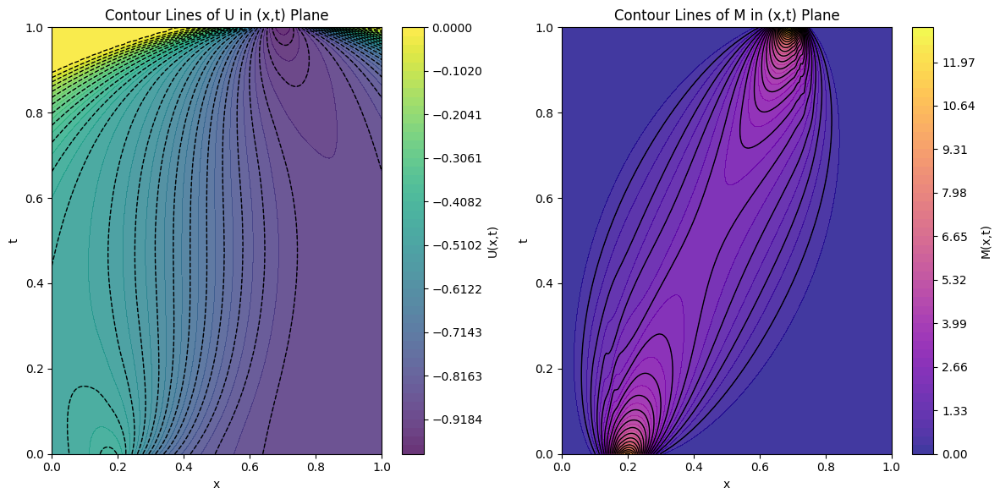

In [6]:
MFG.plot_contours()

In [7]:
MFG.animate_U_M("U_M_animation_a.mp4")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1200, 600) to (1200, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


#### Verify that M is positive

In [8]:
if np.all(MFG.M > 0):
    print("Matrix M is positive (all elements are strictly positive).")
else:
    print("Matrix M has negative elements.")

Matrix M is positive (all elements are strictly positive).


#### Total mass of m

In [9]:
for n in range(MFG.NT+1):
    print(f"Total mass for n = {n}: {np.sum(MFG.M[n,:])}")

Total mass for n = 0: 199.99993069866468
Total mass for n = 1: 199.9999306986647
Total mass for n = 2: 199.99993069866474
Total mass for n = 3: 199.9999306986647
Total mass for n = 4: 199.99993069866474
Total mass for n = 5: 199.9999306986647
Total mass for n = 6: 199.9999306986647
Total mass for n = 7: 199.9999306986647
Total mass for n = 8: 199.99993069866468
Total mass for n = 9: 199.9999306986647
Total mass for n = 10: 199.99993069866468
Total mass for n = 11: 199.9999306986647
Total mass for n = 12: 199.9999306986647
Total mass for n = 13: 199.99993069866468
Total mass for n = 14: 199.99993069866468
Total mass for n = 15: 199.99993069866468
Total mass for n = 16: 199.99993069866466
Total mass for n = 17: 199.99993069866466
Total mass for n = 18: 199.99993069866466
Total mass for n = 19: 199.99993069866466
Total mass for n = 20: 199.99993069866468
Total mass for n = 21: 199.99993069866466
Total mass for n = 22: 199.99993069866463
Total mass for n = 23: 199.99993069866463
Total mass

## (b) $\beta$ = 2, c0 = 0.1, c1 = 5, $\alpha$ = 1, $\sigma$ = 0.02 

In [10]:
MFG_b = MFGs[1]
theta = 0.01
num_iter = 200
thres_iter_HJB = 200
MFG_b.fixed_point(theta, num_iter, thres_iter_HJB = thres_iter_HJB, printer = False)

****************************************************************************************************
****************************************************************************************************
Iteration 1 in fixed point, fixed point error = 0.009420009486418277
****************************************************************************************************
****************************************************************************************************
Iteration 2 in fixed point, fixed point error = 0.009263398925252927
****************************************************************************************************
****************************************************************************************************
Iteration 3 in fixed point, fixed point error = 0.009176824994883669
****************************************************************************************************
**************************************************************************************

(array([[6.00415518e-05, 1.08585388e-04, 1.93453438e-04, ...,
         4.75367892e-81, 4.41056994e-82, 4.03130044e-83],
        [1.48898867e-04, 3.42625589e-04, 7.45250622e-04, ...,
         7.20996145e-36, 7.66724466e-37, 7.35616741e-38],
        [4.83481199e-04, 1.13414979e-03, 2.34575242e-03, ...,
         6.04998162e-34, 6.53974355e-35, 6.36991028e-36],
        ...,
        [1.20986728e+00, 1.21357218e+00, 1.22095351e+00, ...,
         1.90062605e-03, 7.45223850e-03, 4.97600674e-01],
        [1.21077091e+00, 1.21446886e+00, 1.22183410e+00, ...,
         1.16046185e-04, 3.40502373e-04, 5.05754085e-01],
        [1.21136985e+00, 1.21506315e+00, 1.22241741e+00, ...,
         4.97876662e-03, 2.28359709e-04, 2.35553298e-01]]),
 array([[ 5.08217171e-02,  5.08678546e-02,  5.09519293e-02, ...,
         -8.34549237e-01, -8.33923461e-01, -8.33357701e-01],
        [ 5.08179327e-02,  5.08697562e-02,  5.09650818e-02, ...,
         -8.34519241e-01, -8.33891987e-01, -8.33324765e-01],
        [ 5.0

Nous avons dû augmenter le nombre d'itérations pour la méthode de Newton, par rapport au cas (a). Ce qui veut dire que globalement la résolution du système HJB requiert plus d'itérations. De plus, pour de nombreuses itérations en temps, la méthode de Newton ne converge pas. L'erreur obtenue (sans convergence) a tendance à diminuer lorsqu'on avance dans la résolution backward, c'est à dire lorsque n diminue.

La méthode du point fixe converge au bout de 17 itérations.

#### Outputs

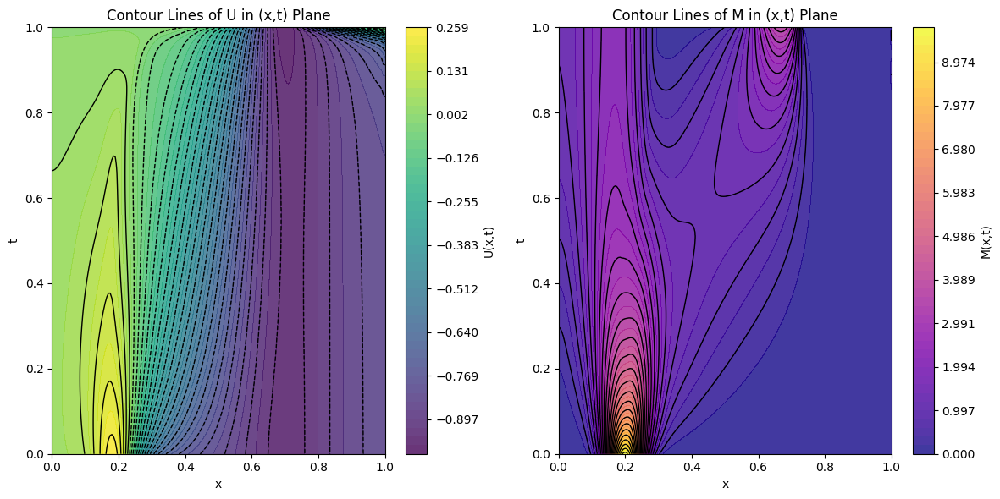

In [11]:
MFG_b.plot_contours()

In [12]:
MFG_b.animate_U_M("U_M_animation_b.mp4")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1200, 600) to (1200, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


#### Verify that M is positive

In [13]:
if np.all(MFG_b.M > 0):
    print("Matrix M is positive (all elements are strictly positive).")
else:
    print("Matrix M has negative elements.")

Matrix M is positive (all elements are strictly positive).


#### Total mass of m

In [14]:
for n in range(MFG_b.NT+1):
    print(f"Total mass for n = {n}: {np.sum(MFG_b.M[n,:])}")

Total mass for n = 0: 199.99993069866466
Total mass for n = 1: 199.99993069866446
Total mass for n = 2: 199.9999306986645
Total mass for n = 3: 199.9999306986645
Total mass for n = 4: 199.99993069866446
Total mass for n = 5: 199.9999306986645
Total mass for n = 6: 199.9999306986645
Total mass for n = 7: 199.99993069866449
Total mass for n = 8: 199.9999306986645
Total mass for n = 9: 199.99993069866449
Total mass for n = 10: 199.99993069866446
Total mass for n = 11: 199.99993069866446
Total mass for n = 12: 199.99993069866449
Total mass for n = 13: 199.99993069866449
Total mass for n = 14: 199.99993069866446
Total mass for n = 15: 199.99993069866446
Total mass for n = 16: 199.99993069866443
Total mass for n = 17: 199.99993069866446
Total mass for n = 18: 199.99993069866443
Total mass for n = 19: 199.99993069866446
Total mass for n = 20: 199.99993069866443
Total mass for n = 21: 199.99993069866443
Total mass for n = 22: 199.99993069866443
Total mass for n = 23: 199.99993069866443
Total m

## (c) $\beta$ = 2, c0 = 0.01, c1 = 2, $\alpha$ = 1.2, $\sigma$ = 0.1 

In [15]:
MFG_c = MFGs[2]
theta = 0.01
num_iter = 200
thres_iter_HJB = 200
MFG_c.fixed_point(theta, num_iter, thres_iter_HJB= thres_iter_HJB, printer = False)

****************************************************************************************************
****************************************************************************************************
Iteration 1 in fixed point, fixed point error = 0.010067668062766566
****************************************************************************************************
****************************************************************************************************
Iteration 2 in fixed point, fixed point error = 0.009928567111796207
****************************************************************************************************
****************************************************************************************************
Iteration 3 in fixed point, fixed point error = 0.009783732469728664
****************************************************************************************************
**************************************************************************************

(array([[6.00415518e-05, 1.08585388e-04, 1.93453438e-04, ...,
         4.75367892e-81, 4.41056994e-82, 4.03130044e-83],
        [7.30510453e-04, 9.48345136e-04, 1.37518066e-03, ...,
         1.02590625e-12, 5.78810890e-13, 3.93210402e-13],
        [2.21721884e-03, 2.64321777e-03, 3.46660351e-03, ...,
         2.41683939e-11, 1.38766978e-11, 9.56294108e-12],
        ...,
        [2.83382163e-03, 2.90714425e-03, 3.04937450e-03, ...,
         3.68934915e-19, 1.10515289e-19, 4.03885683e-20],
        [2.96873380e-03, 3.03802741e-03, 3.17245449e-03, ...,
         5.09099864e-21, 1.46968649e-21, 5.25057551e-22],
        [3.09004091e-03, 3.15510337e-03, 3.28128834e-03, ...,
         3.12815091e-23, 8.84567668e-24, 3.15874112e-24]]),
 array([[-7.38327211e-02, -7.38358413e-02, -7.38365689e-02, ...,
         -7.78755993e-01, -7.78240462e-01, -7.77773891e-01],
        [-7.38101886e-02, -7.38136611e-02, -7.38145638e-02, ...,
         -7.78757376e-01, -7.78241883e-01, -7.77775331e-01],
        [-7.3

Comme dans le cas (b), nous avons dû augmenter le nombre d'itérations pour la méthode de Newton, par rapport au cas (a). Ce qui veut dire que globalement la résolution du système HJB requiert plus d'itérations. Toutefois, la méthode de Newton finit généralemeent par converger dans le nombre d'itérations toléré (ici 200).

La méthode du point fixe converge au bout de 11 itérations.

#### Outputs

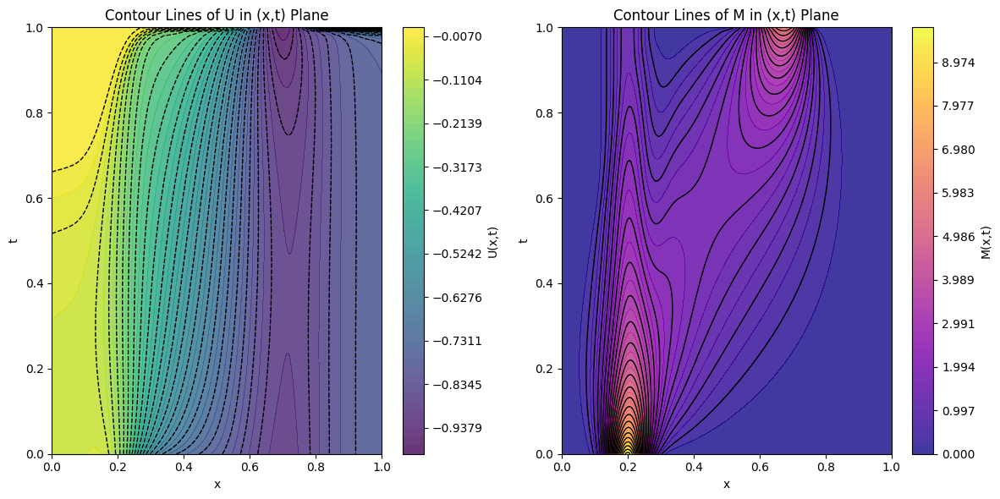

In [16]:
MFG_c.plot_contours()

In [17]:
MFG_c.animate_U_M("U_M_animation_c.mp4")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1200, 600) to (1200, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


#### Verify that M is positive

In [18]:
if np.all(MFG_c.M > 0):
    print("Matrix M is positive (all elements are strictly positive).")
else:
    print("Matrix M has negative elements.")

Matrix M is positive (all elements are strictly positive).


#### Total mass of m

In [19]:
for n in range(MFG_c.NT+1):
    print(f"Total mass for n = {n}: {np.sum(MFG_c.M[n,:])}")

Total mass for n = 0: 199.99993069866466
Total mass for n = 1: 199.9999306986645
Total mass for n = 2: 199.99993069866449
Total mass for n = 3: 199.99993069866454
Total mass for n = 4: 199.99993069866454
Total mass for n = 5: 199.9999306986645
Total mass for n = 6: 199.9999306986645
Total mass for n = 7: 199.9999306986645
Total mass for n = 8: 199.99993069866446
Total mass for n = 9: 199.99993069866449
Total mass for n = 10: 199.9999306986645
Total mass for n = 11: 199.99993069866449
Total mass for n = 12: 199.99993069866449
Total mass for n = 13: 199.99993069866446
Total mass for n = 14: 199.99993069866449
Total mass for n = 15: 199.99993069866449
Total mass for n = 16: 199.99993069866446
Total mass for n = 17: 199.99993069866443
Total mass for n = 18: 199.99993069866443
Total mass for n = 19: 199.99993069866446
Total mass for n = 20: 199.99993069866446
Total mass for n = 21: 199.99993069866443
Total mass for n = 22: 199.99993069866443
Total mass for n = 23: 199.99993069866446
Total m

## (d) $\beta$ = 2, c0 = 0.01, c1 = 2, $\alpha$ = 1.5, $\sigma$ = 0.2 

In [20]:
MFG_d = MFGs[3]
theta = 0.01
num_iter = 200
MFG_d.fixed_point(theta, num_iter, thres_iter_HJB= thres_iter_HJB, printer = False)

****************************************************************************************************
****************************************************************************************************
Iteration 1 in fixed point, fixed point error = 0.009604006288245065
****************************************************************************************************
****************************************************************************************************
Iteration 2 in fixed point, fixed point error = 0.009479359548071668
****************************************************************************************************
****************************************************************************************************
Iteration 3 in fixed point, fixed point error = 0.00935154544641004
****************************************************************************************************
***************************************************************************************

(array([[6.00415518e-05, 1.08585388e-04, 1.93453438e-04, ...,
         4.75367892e-81, 4.41056994e-82, 4.03130044e-83],
        [1.62040670e-05, 2.91159778e-05, 5.39680053e-05, ...,
         1.06934955e-06, 8.94584489e-07, 8.09444366e-07],
        [1.10987417e-05, 2.11305956e-05, 4.31931709e-05, ...,
         1.10913492e-05, 9.47480838e-06, 8.67947680e-06],
        ...,
        [5.62246583e-01, 5.62139283e-01, 5.61915585e-01, ...,
         2.56968645e-02, 8.01228839e-02, 3.02051226e-01],
        [5.61402610e-01, 5.61267410e-01, 5.60989309e-01, ...,
         6.81813764e-04, 6.33451530e-03, 2.56144382e-01],
        [5.60109346e-01, 5.59945207e-01, 5.59610655e-01, ...,
         2.75307055e-04, 1.53136566e-05, 1.02799436e-01]]),
 array([[-6.14934721e-02, -6.15954880e-02, -6.17350463e-02, ...,
         -7.08263399e-01, -7.07748696e-01, -7.07282541e-01],
        [-6.00727862e-02, -6.01713783e-02, -6.03069296e-02, ...,
         -7.08272112e-01, -7.07757658e-01, -7.07291627e-01],
        [-5.8

Comme dans les cas (b) et (c), nous avons dû augmenter le nombre d'itérations pour la méthode de Newton, par rapport au cas (a). Ce qui veut dire que globalement la résolution du système HJB requiert plus d'itérations. Toutefois, la méthode de Newton finit quasiment toujours par converger dans le nombre d'itérations toléré (ici 200).

La méthode du point fixe converge au bout de 9 itérations.

#### Outputs

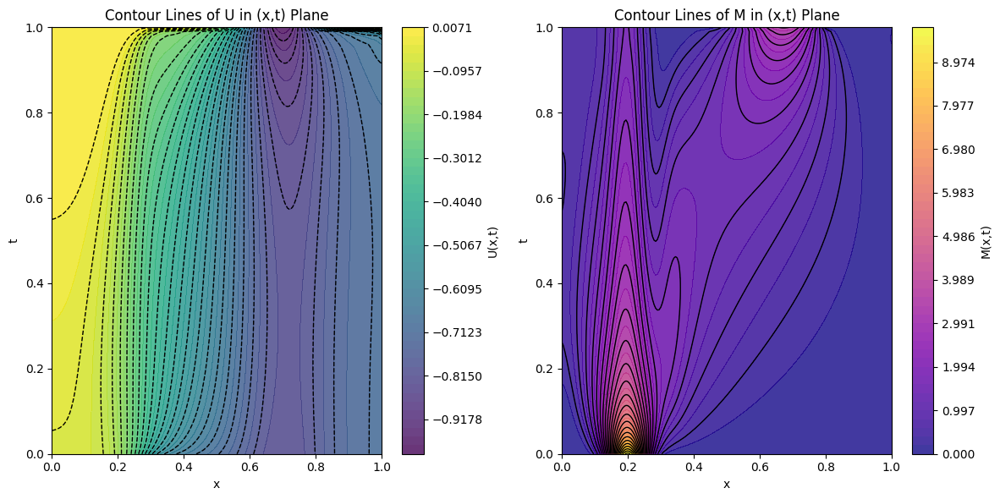

In [21]:
MFG_d.plot_contours()

In [22]:
MFG_d.animate_U_M("U_M_animation_d.mp4")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1200, 600) to (1200, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


#### Verify that M is positive

In [23]:
if np.all(MFG_d.M > 0):
    print("Matrix M is positive (all elements are strictly positive).")
else:
    print("Matrix M has negative elements.")

Matrix M is positive (all elements are strictly positive).


#### Total mass of m

In [24]:
for n in range(MFG_d.NT+1):
    print(f"Total mass for n = {n}: {np.sum(MFG_d.M[n,:])}")

Total mass for n = 0: 199.99993069866466
Total mass for n = 1: 199.9999306986645
Total mass for n = 2: 199.9999306986645
Total mass for n = 3: 199.99993069866449
Total mass for n = 4: 199.99993069866449
Total mass for n = 5: 199.99993069866454
Total mass for n = 6: 199.99993069866449
Total mass for n = 7: 199.99993069866446
Total mass for n = 8: 199.99993069866449
Total mass for n = 9: 199.99993069866446
Total mass for n = 10: 199.99993069866446
Total mass for n = 11: 199.99993069866446
Total mass for n = 12: 199.99993069866449
Total mass for n = 13: 199.99993069866443
Total mass for n = 14: 199.99993069866446
Total mass for n = 15: 199.99993069866443
Total mass for n = 16: 199.9999306986644
Total mass for n = 17: 199.99993069866446
Total mass for n = 18: 199.99993069866446
Total mass for n = 19: 199.9999306986644
Total mass for n = 20: 199.9999306986644
Total mass for n = 21: 199.9999306986644
Total mass for n = 22: 199.9999306986644
Total mass for n = 23: 199.99993069866437
Total mas

## (e) $\beta$ = 2, c0 = 1, c1 = 3, $\alpha$ = 2, $\sigma$ = 0.002

In [25]:
MFG_e = MFGs[4]
theta = 0.01
num_iter = 200
thres_iter_HJB = 200
MFG_e.fixed_point(theta, num_iter, thres_iter_HJB= thres_iter_HJB, printer = False)

****************************************************************************************************
****************************************************************************************************
Iteration 1 in fixed point, fixed point error = 0.008916522855506455
****************************************************************************************************
****************************************************************************************************
Iteration 2 in fixed point, fixed point error = 0.008754111699823467
****************************************************************************************************
****************************************************************************************************
Iteration 3 in fixed point, fixed point error = 0.00860344291150208
****************************************************************************************************
***************************************************************************************

(array([[6.00415518e-05, 1.08585388e-04, 1.93453438e-04, ...,
         4.75367892e-81, 4.41056994e-82, 4.03130044e-83],
        [6.79979427e-05, 1.25060147e-04, 2.31306685e-04, ...,
         1.14357307e-54, 4.55044747e-56, 1.15357123e-57],
        [7.79786959e-05, 1.47541253e-04, 2.86916549e-04, ...,
         1.42792269e-52, 5.79413664e-54, 1.49828044e-55],
        ...,
        [9.47338260e-01, 9.53311768e-01, 9.65240232e-01, ...,
         9.13654696e-07, 6.80932956e-08, 2.41935236e-05],
        [9.47968580e-01, 9.53938308e-01, 9.65858085e-01, ...,
         1.76206805e-07, 1.14727557e-08, 2.41814074e-05],
        [9.48286411e-01, 9.54253778e-01, 9.66169355e-01, ...,
         1.60967901e-06, 2.45335683e-06, 1.61370442e-05]]),
 array([[ 3.76121742e-02,  3.77666046e-02,  3.80220362e-02, ...,
         -8.20736680e-01, -8.18965497e-01, -8.17225460e-01],
        [ 3.76119940e-02,  3.77720828e-02,  3.80372444e-02, ...,
         -8.20382327e-01, -8.18598669e-01, -8.16845307e-01],
        [ 3.7

Comme dans le cas (b), nous avons dû augmenter le nombre d'itérations pour la méthode de Newton, par rapport au cas (a). Ce qui veut dire que globalement la résolution du système HJB requiert plus d'itérations. De plus, pour de nombreuses itérations en temps, la méthode de Newton ne converge pas. 

La méthode du point fixe converge au bout de 10 itérations.

#### Outputs

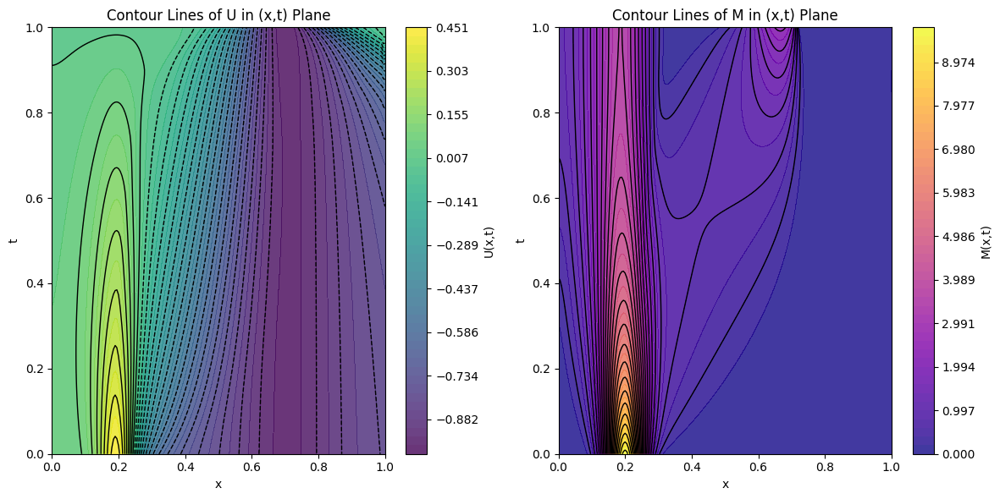

In [26]:
MFG_e.plot_contours()

In [27]:
MFG_e.animate_U_M("U_M_animation_e.mp4")

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1200, 600) to (1200, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


#### Verify that M is positive

In [28]:
if np.all(MFG_e.M > 0):
    print("Matrix M is positive (all elements are strictly positive).")
else:
    print("Matrix M has negative elements.")

Matrix M is positive (all elements are strictly positive).


#### Total mass of m

In [29]:
for n in range(MFG_e.NT+1):
    print(f"Total mass for n = {n}: {np.sum(MFG_e.M[n,:])}")

Total mass for n = 0: 199.99993069866466
Total mass for n = 1: 199.99993069866454
Total mass for n = 2: 199.9999306986645
Total mass for n = 3: 199.99993069866449
Total mass for n = 4: 199.9999306986645
Total mass for n = 5: 199.9999306986645
Total mass for n = 6: 199.9999306986645
Total mass for n = 7: 199.99993069866449
Total mass for n = 8: 199.99993069866449
Total mass for n = 9: 199.9999306986645
Total mass for n = 10: 199.99993069866449
Total mass for n = 11: 199.99993069866449
Total mass for n = 12: 199.99993069866454
Total mass for n = 13: 199.99993069866446
Total mass for n = 14: 199.99993069866446
Total mass for n = 15: 199.9999306986645
Total mass for n = 16: 199.99993069866449
Total mass for n = 17: 199.9999306986645
Total mass for n = 18: 199.9999306986645
Total mass for n = 19: 199.99993069866454
Total mass for n = 20: 199.99993069866454
Total mass for n = 21: 199.9999306986645
Total mass for n = 22: 199.99993069866454
Total mass for n = 23: 199.9999306986645
Total mass f

# VI. Interprétation et comparaison

- En $t = N_T$, u a la forme de l'opposée d'une loi gaussienne. Cela est dû à la condition terminale de l'équation HJB
- En $t = 0$, la densité m est celle d'une loi normale centrée en 0.2. Cela s'explique par la condition initiale de l'équation KFP
- Au fil du temps, cette densité se déplace vers $x = 0.7$, du fait de la condition terminale.
- Le déplacement de $x = 0.2$ vers $x = 0.7$ se fait de différentes manières selon le choix du paramètres.
- $\sigma$ contrôle $\nu$ donc l'effet de diffusion tandis que les paramètres $\beta$, $c_0$, $c_1$ et $\alpha$ contrôlent l'effet de congestion à travers le terme Hamiltonien.
- Plus $\alpha$, $c_0$ ou $c_1 $ sont grands, plus l'effet de congestion est prononcé, cela se voit par le fait que les lignes de niveau sont encombrés. C'est le cas dans les exemples (b) et (e) ou la convergence est particulièrement ardue. Les lignes de niveau montrent une transition relativement douce. $\beta$ reste identique dans tous les cas.
- $\sigma$ contrôle la volatilité et donc plus il est grand, plus il existe un effet de diffusion et donc plus les lignes de niveau sont volatiles et dispersées.